In [1]:
import os
import pandas as pd
import preprocess
import cv2
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

pd.set_option("display.max_rows",999)

In [2]:
DATA_DIR_PATH = preprocess.DATA_DIR_PATH
NUM_CLASSES = 120

In [83]:
labels = pd.read_csv(os.path.join(preprocess.DATA_DIR, 'labels.csv'))

def get_img_cls_from_id(img_id):
    return labels[labels.id == img_id]['breed'].values[0]

### Breed by Frequency, Note classes are imbalanced

In [116]:
labels.groupby('breed').count().sort_values(by='id', ascending=False)

,id
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
shih-tzu,112
great_pyrenees,111
pomeranian,111
basenji,110


In [125]:
def read_image_as_rbg(img_id = None, shape = None):
    #img_id = '0a0c223352985ec154fd604d7ddceabd'
    img_BGR = cv2.imread(os.path.join(DATA_DIR_PATH, 'train', f'{img_id}.jpg'))
    if shape is not None:
        img_BGR = cv2.resize(img_BGR, shape)
    return cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

In [126]:
#labels[labels.breed == 'scottish_deerhound'].id.tolist()[:5]

In [127]:
#4 Breed I chose fo fun
breeds = ['scottish_deerhound', 'maltese_dog', 'bluetick', 'pug']

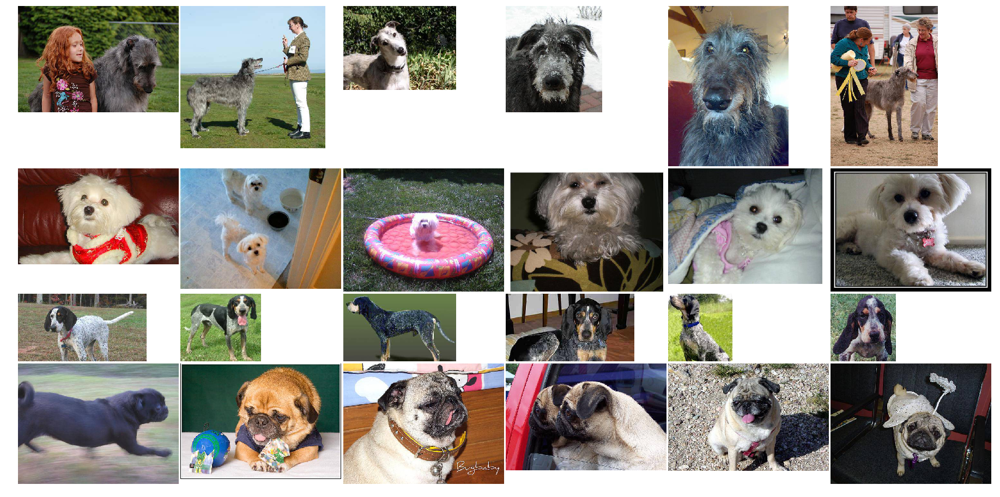

In [128]:
NUM_SAMPLE_PER_BREED = 6

fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(len(breeds), NUM_SAMPLE_PER_BREED), axes_pad=0.05)

idx = 0
for breed in breeds:
    for img_id in labels[labels.breed == breed].id.tolist()[:6]:
        ax = grid[idx]
        img = read_image_as_rbg(img_id=img_id)
        ax.imshow(img)
        ax.axis('off')
        idx += 1
plt.show()

### there already exists a model for classifying Maltese Dogs and Scottish Deerhounds

We can use the weights of any model that's been trained on imagenet keras comes with some pre-trained "classical" models that are trained on existing datasets VGG16 is a "16-layer network used by the VGG team in the ILSVRC-2014 competition"

TODO: show image of the model

In [40]:
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input, decode_predictions

In [41]:
model_vgg16 = VGG16(weights='imagenet')

In [54]:
img_id = '0042188c895a2f14ef64a918ed9c7b64'

In [55]:
img = read_image_as_rbg(img_id=img_id, shape = (224, 224))
print(img.shape, img.max(), img.min())

(224, 224, 3) 254 0


In [65]:
x = preprocess_input(np.expand_dims(img.copy() + 0.0, axis = 0)) #return (1, 224, 224, 3)
preds = model_vgg16.predict(x)

In [87]:
res = decode_predictions(preds, top=2)
res

[[('n02092002', 'Scottish_deerhound', 0.78298694),
  ('n02090721', 'Irish_wolfhound', 0.19540448)]]

In [112]:
def plot_image_and_labels(img_arr, true_cls, pred1, pred2):
    _, cls1, prob1 = pred1
    _,cls2, prob2 = pred2
#     cls, prob = 'Scottish_deerhound', 0.78298694
#     breed = 'scottish'
    plt.imshow(img)
    plt.text(10, 200, 'Predicted: %s (%.3f)' % (cls1 , prob1), color='w', backgroundcolor='k', alpha=0.8)
    plt.text(10, 220, 'Predicted: %s (%.3f)' % (cls2 , prob2), color='w', backgroundcolor='k', alpha=0.8)
    plt.text(10, 15, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
    plt.axis('off')
    plt.show()

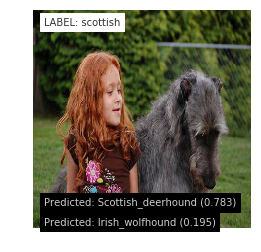

In [113]:
plot_image_and_labels(x, get_img_cls_from_id(img_id), pred1 = res[0][0], pred2=res[0][1])

starting scottish_deerhound
starting maltese_dog
starting bluetick
starting pug


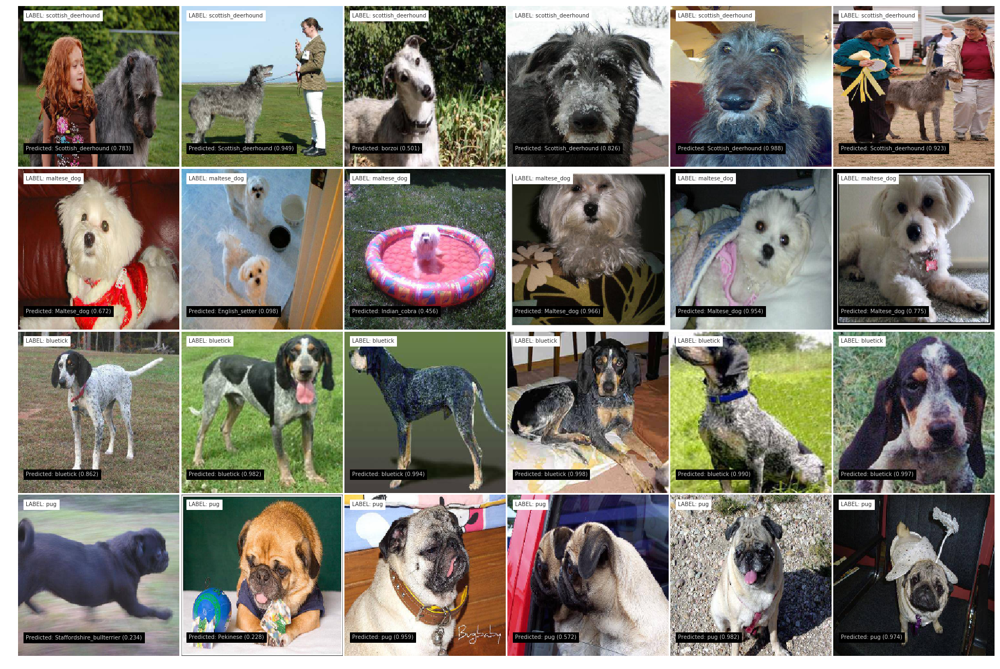

In [129]:
NUM_SAMPLE_PER_BREED = 6

fig = plt.figure(1, figsize=(32, 32))
grid = ImageGrid(fig, 111, nrows_ncols=(len(breeds), NUM_SAMPLE_PER_BREED), axes_pad=0.05)

idx = 0
for breed in breeds:
    print('starting', breed)
    for img_id in labels[labels.breed == breed].id.tolist()[:6]:
        ax = grid[idx]
        img = read_image_as_rbg(img_id=img_id, shape = (224, 224))
        x = preprocess_input(np.expand_dims(img.copy().astype(float), axis = 0)) #return (1, 224, 224, 3)
        preds = model_vgg16.predict(x)
        _, cls, prob = decode_predictions(preds, top=1)[0][0]
        ax.imshow(img)
        ax.text(10, 200, 'Predicted: %s (%.3f)' % (cls , prob), color='w', backgroundcolor='k', alpha=0.8)
        ax.text(10, 15, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
        ax.axis('off')
        idx += 1
plt.show()

### Create Training and Test Dataset

In [171]:
tmp = np.vstack( (np.array([1,1,1]), np.array([0,0,0])) )
tmp.sum(axis = 0)

array([1, 1, 1])

In [231]:
x_train_list_id = []
y_train_labels = None
BREED_TO_IDX_MAP = { breed:idx for idx, breed in enumerate(breeds)}
IDX_TO_BREED_MAP = { idx:breed for idx, breed in enumerate(breeds)}

for idx, breed in enumerate(breeds):
    BREED_TO_IDX_MAP[breed] = idx
    breed_list = labels[labels.breed == breed].id.tolist() 
    num_ids = len(breed_list)
    
    breed_y = np.zeros((len(breed_list), len(breeds)))
    breed_y[:, idx] = 1 #mark response for this breed at this index
    
    
    x_train_list_id.extend( breed_list )
    
    print(len(breed_list), breed_y.shape)

    if y_train_labels is None:
        y_train_labels = breed_y
    else:
        y_train_labels = np.vstack( (y_train_labels, breed_y) )

        
print(BREED_TO_IDX_MAP)
print(IDX_TO_BREED_MAP)
print(len(x_train_list_id), y_train_labels.shape, y_train_labels.sum(axis = 0))
    

126 (126, 4)
117 (117, 4)
85 (85, 4)
94 (94, 4)
{'scottish_deerhound': 0, 'maltese_dog': 1, 'bluetick': 2, 'pug': 3}
{0: 'scottish_deerhound', 1: 'maltese_dog', 2: 'bluetick', 3: 'pug'}
422 (422, 4) [ 126.  117.   85.   94.]


In [236]:
def decode_arr(input_arr):
    """
    input_arr: vector of size 4
    """
    assert input_arr.shape == (4,), 'input wrong shape'
    return IDX_TO_BREED_MAP[input_arr.argmax()]
    
    

### Make Matrix of training images scaled to 100 by 100

In [205]:
def get_image_matrix_from_ids(list_of_ids, output_size = (200, 200)):
    img_matrix = np.zeros((len(list_of_ids), output_size[0], output_size[1], 3), dtype='float32') #stores all of the images in a 4 dim tensor  
    for idx, img_id in enumerate(list_of_ids):
        img = read_image_as_rbg(img_id=img_id, shape=output_size)
        img_matrix[idx] = img
    return img_matrix

In [212]:
x_train = get_image_matrix_from_ids(x_train_list_id)

In [259]:
def normalize_images(img_tensor):
    return (img_tensor - 128.0) / 128.0 #scales all values to -1.0 to 1.0

In [257]:
NUM_SAMPLES = x_train.shape[0]

idx_arr =  np.arange(NUM_SAMPLES)
np.random.shuffle(idx_arr)
print('sample of random array', idx_arr[:25])

train_arr = idx_arr[:int(NUM_SAMPLES * 0.8)]
valid_arr = idx_arr[int(NUM_SAMPLES * 0.8):]

X_train_arr = x_train[train_arr]
X_valid_arr = x_train[valid_arr]

y_train_arr = y_train_labels[train_arr]
y_valid_arr = y_train_labels[valid_arr]

print(X_train_arr.shape, y_train_arr.shape)
print(y_train_arr.sum(axis = 0))

sample of random array [302 285 288 387  19 296  68  73 141 270 346 201 136 144   4  22  51 297
 402 290  17  63  39 253 161]
(337, 200, 200, 3) (337, 4)
[ 102.   90.   69.   76.]


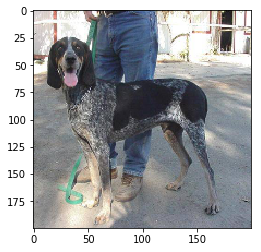

bluetick


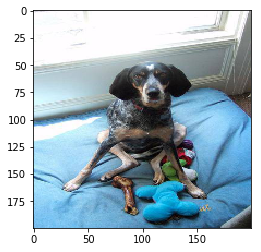

bluetick


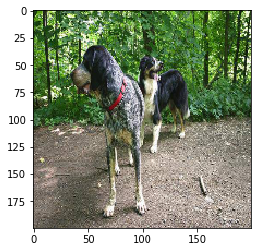

bluetick


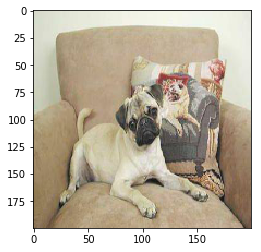

pug


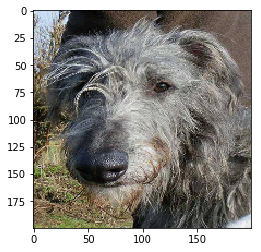

scottish_deerhound


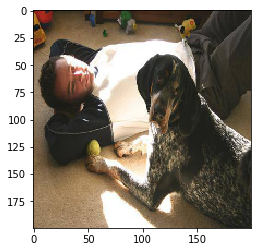

bluetick


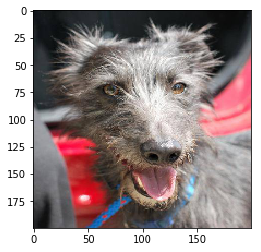

scottish_deerhound


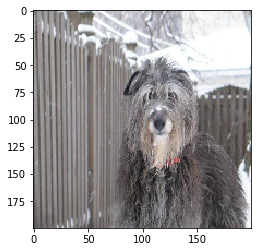

scottish_deerhound


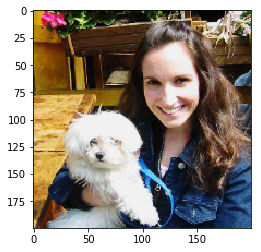

maltese_dog


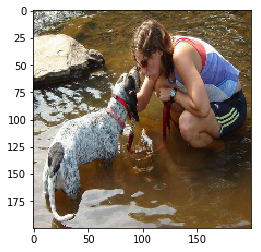

bluetick


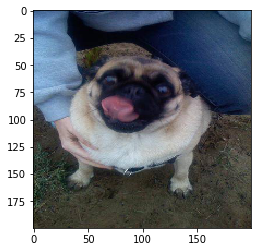

pug


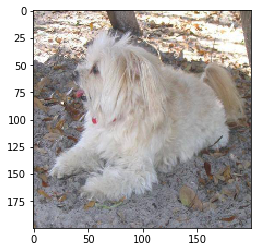

maltese_dog


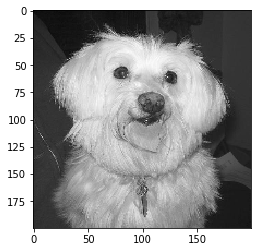

maltese_dog


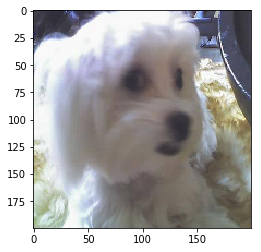

maltese_dog


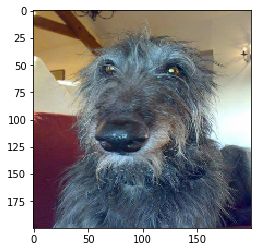

scottish_deerhound


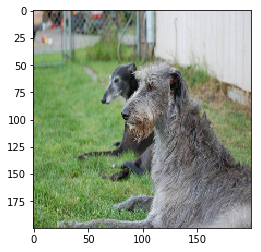

scottish_deerhound


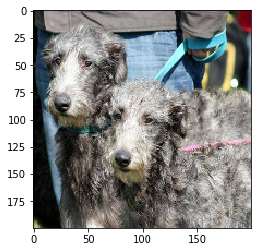

scottish_deerhound


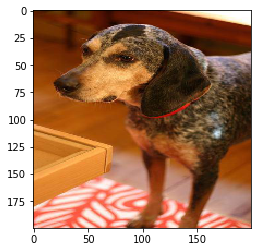

bluetick


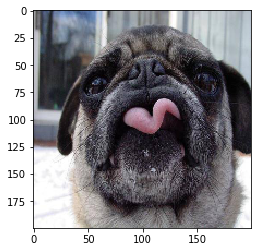

pug


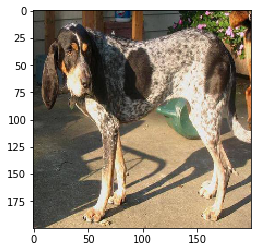

bluetick


In [258]:
for i in range(20):
    plt.imshow(X_train_arr[i].astype('uint8'))
    plt.show()
    print(decode_arr(y_train_arr[i]))

In [237]:
decode_arr(y_train_arr[20])

'maltese_dog'

In [308]:
import numpy as np
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD
import time

In [321]:
model.reset_states()

In [322]:
#based on mnist architecture and way too slow to train

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(200, 200, 3)))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2))) #usually this variable is 2, 2
model.add(Dropout(0.25))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
#model.add(Dropout(0.5))
model.add(Dense(4, activation='softmax'))

sgd = SGD(lr=0.01, decay=1e-6, momentum=0.9, nesterov=True)
model.compile(loss='categorical_crossentropy', optimizer=sgd)
model.summary()
#model.fit(x_train, y_train, batch_size=32, epochs=10)
#score = model.evaluate(x_test, y_test, batch_size=32)


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_105 (Conv2D)          (None, 198, 198, 32)      896       
_________________________________________________________________
conv2d_106 (Conv2D)          (None, 196, 196, 32)      9248      
_________________________________________________________________
max_pooling2d_53 (MaxPooling (None, 98, 98, 32)        0         
_________________________________________________________________
dropout_69 (Dropout)         (None, 98, 98, 32)        0         
_________________________________________________________________
conv2d_107 (Conv2D)          (None, 96, 96, 64)        18496     
_________________________________________________________________
conv2d_108 (Conv2D)          (None, 94, 94, 64)        36928     
_________________________________________________________________
max_pooling2d_54 (MaxPooling (None, 47, 47, 64)        0         
__________

In [323]:
X_train_arr_norm = normalize_images(X_train_arr)
X_valid_arr_norm = normalize_images(X_valid_arr)

In [ ]:
start = time.time()
NUM_EPOCHS = 17
for i in range(NUM_EPOCHS):
    print('Training Step: ', i)
    model.fit(X_train_arr_norm, y_train_arr, batch_size=32, epochs=1)
    if i % 2 == 0:
        acc = (model.predict_classes(X_valid_arr_norm) == y_valid_arr.argmax()).astype('float32').mean()
        print('Prediction Accuracy', acc)
    
print('Total Elapsed Time', time.time() - start)

Training Step:  0
Epoch 1/1
85/85 [==============================] - 10s    
Prediction Accuracy 0.0
Training Step:  1
Epoch 1/1
337/337 [==============================] - 107s - loss: 1.3485   
Training Step:  2
Epoch 1/1
85/85 [==============================] - 8s     
Prediction Accuracy 0.152941
Training Step:  3
Epoch 1/1
337/337 [==============================] - 125s - loss: 1.1052   
Training Step:  4
Epoch 1/1
 32/337 [=>............................] - ETA: 86s - loss: 0.8662

In [245]:
score = model.evaluate(X_valid_arr, y_valid_arr, batch_size=32)

85/85 [==============================] - 6s     


In [280]:
(model.predict_classes(X_valid_arr) == y_valid_arr.argmax()).astype('float32').mean()

85/85 [==============================] - 6s     


0.05882353

In [147]:
penny =  '/Users/mwoods/Downloads/penny123.jpg'

In [148]:

#img_id = '0a0c223352985ec154fd604d7ddceabd'
img_BGR = cv2.imread(penny)
shape = (224, 224)
if shape is not None:
    img_BGR = cv2.resize(img_BGR, shape)
img = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)

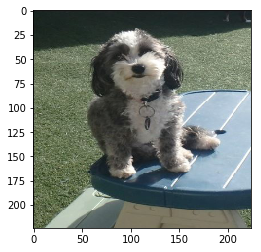

In [149]:
plt.imshow(img)
plt.show()

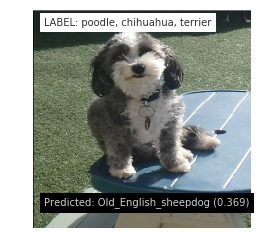

In [151]:
breed = 'poodle, chihuahua, terrier'

x = preprocess_input(np.expand_dims(img.copy().astype(float), axis = 0)) #return (1, 224, 224, 3)
preds = model_vgg16.predict(x)
_, cls, prob = decode_predictions(preds, top=5)[0][0]
plt.imshow(img)
plt.text(10, 200, 'Predicted: %s (%.3f)' % (cls , prob), color='w', backgroundcolor='k', alpha=0.8)
plt.text(10, 15, 'LABEL: %s' % breed, color='k', backgroundcolor='w', alpha=0.8)
plt.axis('off')
plt.show()

In [152]:
decode_predictions(preds, top=5)

[[('n02105641', 'Old_English_sheepdog', 0.36899653),
  ('n02097474', 'Tibetan_terrier', 0.34114593),
  ('n02113624', 'toy_poodle', 0.06190249),
  ('n02113712', 'miniature_poodle', 0.054963518),
  ('n02086240', 'Shih-Tzu', 0.047548458)]]